<a href="https://colab.research.google.com/github/SOtero425/DS_Examples/blob/main/ID_tampering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**ID Card Tampering**

In this project we will use computer vision to detect if there has been tampering of an ID card. The ability to catch false IDs before granting access or product is critical for organizations for both security and liability.

In [1]:
# Import packages
from skimage.metrics import structural_similarity
import imutils
import cv2
from PIL import Image
import requests

In [2]:
!mkdir id_card_tampering
!mkdir id_card_tampering/image

mkdir: cannot create directory ‘id_card_tampering’: File exists
mkdir: cannot create directory ‘id_card_tampering/image’: File exists


In [3]:
# Obtain image data
original = Image.open(requests.get('https://www.thestatesman.com/wp-content/uploads/2019/07/pan-card.jpg', stream = True).raw)
tampered = Image.open(requests.get('https://assets1.cleartax-cdn.com/s/img/20170526124335/Pan4.png', stream = True).raw)

In [4]:
# We'll check the format and pixel size of the original and tampered images
print("Original image format: ", original.format)
print("Tampered image format: ", tampered.format)

print("Original image size: ", original.size)
print("Tampered image size: ", tampered.size)

Original image format:  JPEG
Tampered image format:  PNG
Original image size:  (1200, 800)
Tampered image size:  (282, 179)


In [5]:
# The images are different formats and different sizes. We will now make both 
# identical
original = original.resize((250,160))
print(original.size)
original.save('id_card_tampering/image/original.png')

tampered = tampered.resize((250,160))
print(tampered.size)
tampered.save('id_card_tampering/image/tampered.png')

(250, 160)
(250, 160)


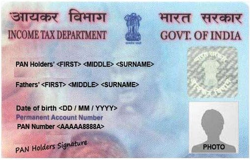

In [6]:
# We'll display the original and then tampered images.
original

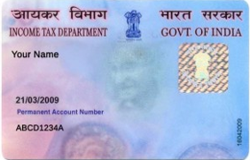

In [7]:
tampered

In [8]:
# Read the images using cv2
original = cv2.imread('id_card_tampering/image/original.png')
tampered = cv2.imread('id_card_tampering/image/tampered.png')

In [9]:
# Convert to grayscale. We are concerting to grayscale as it is easier for the 
# computer to identify important boundaries and features due to the the 1
# channel rather than 3 of an RBG image.
original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
tampered_gray = cv2.cvtColor(tampered, cv2.COLOR_BGR2GRAY)

In [10]:
# Computer the Structural Similarity Index (SSIM) between the two images
(score, diff) = structural_similarity(original_gray, tampered_gray, full = True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SSIM: 0.31678790332739426


The SSIM value tells us that the images are only 31% identical, which is pretty low for standardized IDs. We can do more, though.

In [11]:
# Calculate thresholds and contours. In this case the image is transformed into 
# a binary image and the contours are then detected and the values grabbed.
thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

In [12]:
# Calculate the bounding box and draw onto both images to highlight similarities
# and differences.
for c in cnts:
  (x, y, w, h) = cv2.boundingRect(c)
  cv2.rectangle(original, (x, y), (x + w, y + h), (0, 0, 255), 2)
  cv2.rectangle(tampered, (x, y), (x + w, y + h), (0, 0, 255), 2)

Original Format Image


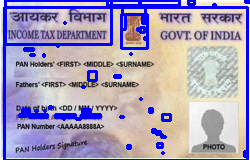

In [13]:
# Now we'll display images highlighting differences
print("Original Format Image")
Image.fromarray(original)

Tampered Format Image


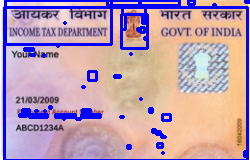

In [14]:
print('Tampered Format Image')
Image.fromarray(tampered)

Difference Image


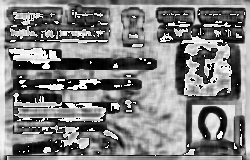

In [15]:
print('Difference Image')
Image.fromarray(diff)

Threshold Image


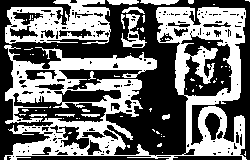

In [16]:
print('Threshold Image')
Image.fromarray(thresh)

**Summary**

While the bounding boxes weren't particularly helpful in highlighting the similarities or differences, a cursory glance at the difference and threshold images makes it immediately clear that these two images are very different.

Therefore, we declare the "submitted" image to have been tampered.

**Next Steps**

The provided images were very basic, so for the next test I will instead use 2 images that the relationship between is known and see if we can come to the correct conclusion.

In [17]:
original_2 = Image.open(requests.get('https://scontent-atl3-2.xx.fbcdn.net/v/t39.30808-6/292059397_10158496928192035_2302379281015101781_n.jpg?_nc_cat=108&ccb=1-7&_nc_sid=0debeb&_nc_ohc=qKClYI2iRmsAX-pEI09&tn=p7rbcCtvr687Vsai&_nc_ht=scontent-atl3-2.xx&oh=00_AT8KtWlmzoxx16Eb__XERB1OT7zlY0bOs6HZEn60uIdZjg&oe=62C808EB', stream = True).raw)
submitted_2 = Image.open(requests.get('https://scontent-atl3-2.xx.fbcdn.net/v/t39.30808-6/291839975_10158496928117035_6341044470310676297_n.jpg?_nc_cat=101&ccb=1-7&_nc_sid=0debeb&_nc_ohc=7AUOTy1wetsAX9sXzX3&tn=p7rbcCtvr687Vsai&_nc_ht=scontent-atl3-2.xx&oh=00_AT9sWsLYc2zEnta43H5veKfkrYD6iy2LUgDkw6jzE9vdTw&oe=62C7B45C', stream = True).raw)

In [18]:
# We'll check the format and pixel size of the original and tampered images
print("Original image format: ", original_2.format)
print("Submitted image format: ", submitted_2.format)

print("Original image size: ", original_2.size)
print("Submitted image size: ", submitted_2.size)

Original image format:  JPEG
Submitted image format:  JPEG
Original image size:  (2048, 1152)
Submitted image size:  (2048, 1151)


In [22]:
# The images are different formats and slightly different sizes. We will now 
# make both identical
original_2 = original_2.resize((2048,1150))
print(original_2.size)
original_2.save('id_card_tampering/image/original_2.png')

submitted_2 = submitted_2.resize((2048,1150))
print(submitted_2.size)
submitted_2.save('id_card_tampering/image/submitted_2.png')

(2048, 1150)
(2048, 1150)


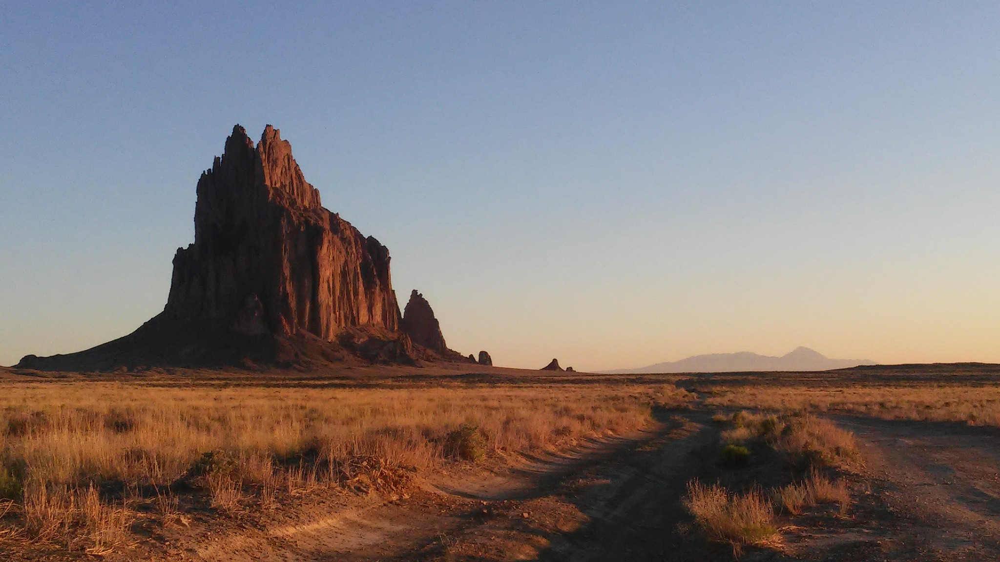

In [20]:
# We'll display the original and then tampered images.
original_2

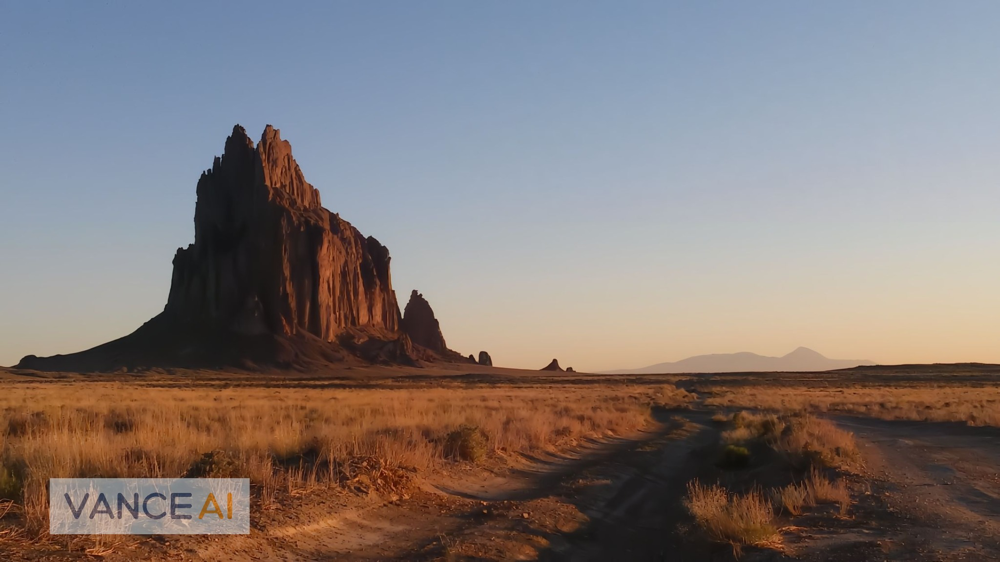

In [21]:
submitted_2

Now we'll convert the image to grayscale, calculate the SSIM, and display bounding boxes, threshold, and differences.

In [23]:
#Read the images using cv2
original_2 = cv2.imread('id_card_tampering/image/original_2.png')
submitted_2 = cv2.imread('id_card_tampering/image/submitted_2.png')

In [24]:
# Convert to grayscale. We are concerting to grayscale as it is easier for the 
# computer to identify important boundaries and features due to the the 1
# channel rather than 3 of an RBG image.
original_2_gray = cv2.cvtColor(original_2, cv2.COLOR_BGR2GRAY)
submitted_2_gray = cv2.cvtColor(submitted_2, cv2.COLOR_BGR2GRAY)

In [25]:
# Computer the Structural Similarity Index (SSIM) between the two images
(score, diff) = structural_similarity(original_2_gray, submitted_2_gray, full = True)
diff = (diff * 255).astype("uint8")
print("SSIM: {}".format(score))

SSIM: 0.9042614654201679


The SSIM value tells us that the images are 90% identical. That's pretty high, but certainly not the same. Let's see what the other images highlight for us.

In [26]:
# Calculate thresholds and contours. In this case the image is transformed into 
# a binary image and the contours are then detected and the values grabbed.
thresh = cv2.threshold(diff, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

In [27]:
# Calculate the bounding box and draw onto both images to highlight similarities
# and differences.
for c in cnts:
  (x, y, w, h) = cv2.boundingRect(c)
  cv2.rectangle(original_2, (x, y), (x + w, y + h), (0, 0, 255), 2)
  cv2.rectangle(submitted_2, (x, y), (x + w, y + h), (0, 0, 255), 2)

Original Format Image


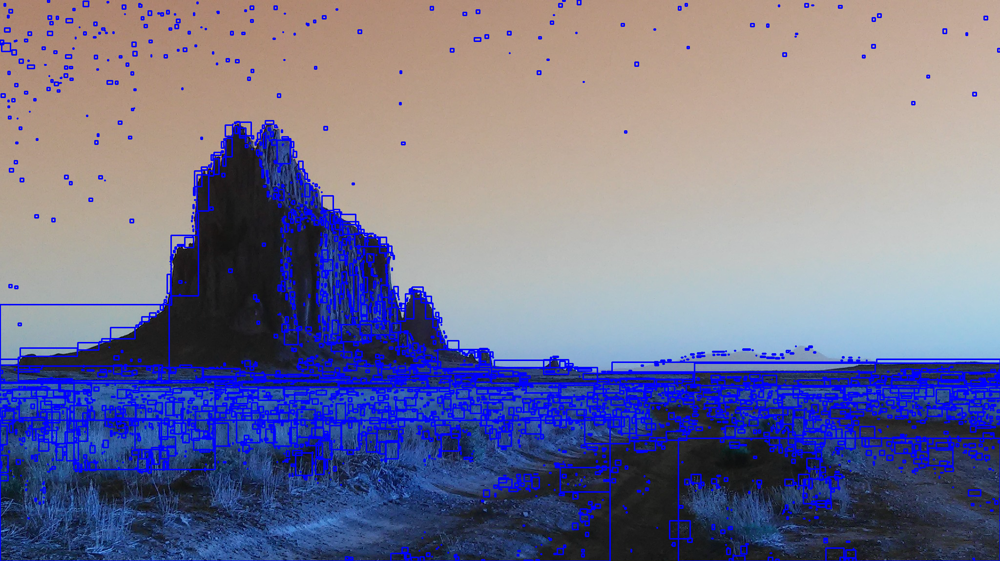

In [28]:
# Now we'll display images highlighting differences
print("Original Format Image")
Image.fromarray(original_2)

Tampered Format Image


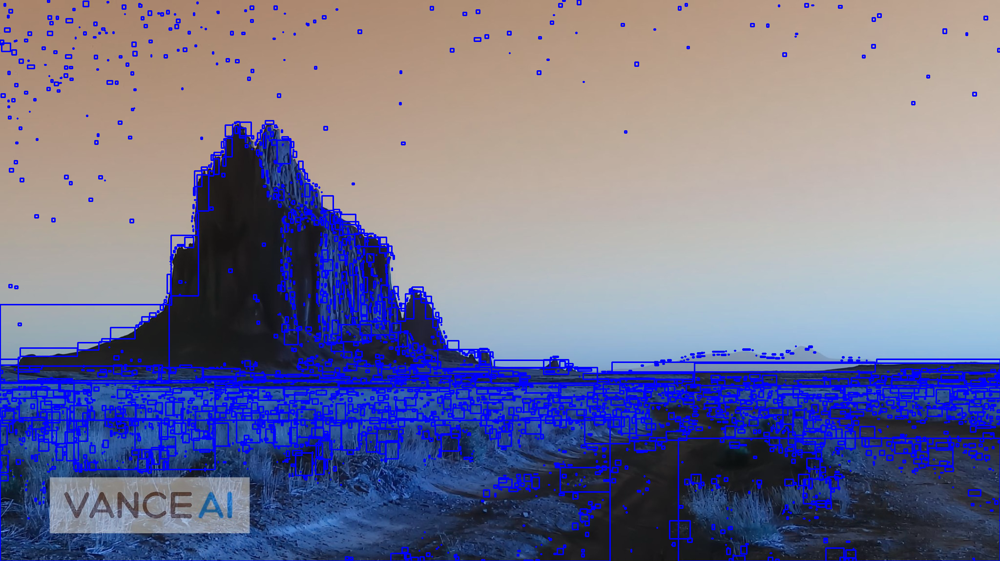

In [29]:
print('Tampered Format Image')
Image.fromarray(submitted_2)

Difference Image


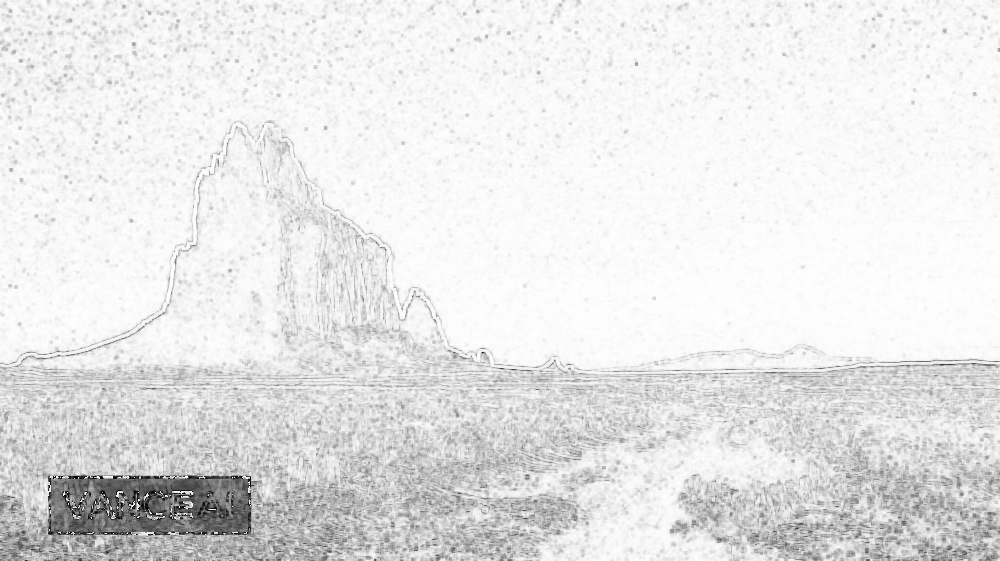

In [30]:
print('Difference Image')
Image.fromarray(diff)

Threshold Image


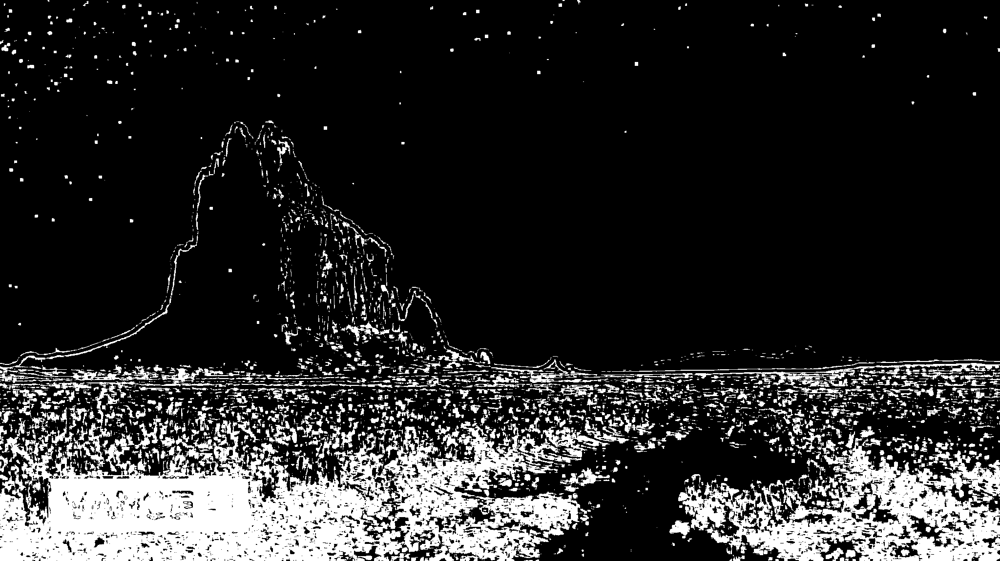

In [31]:
print('Threshold Image')
Image.fromarray(thresh)

Having known from the beginning that the second image was altered - smoothed and slightly edited from the original - I am impressed by how well the functions identified and highlighted those areas most effected by the editing. This has, indeed, been altered. But what about two images that are legitimate, but different? Such as two driver's licenses from the same state?